In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import scipy
from scipy import stats
from scipy.stats import zscore
import sklearn
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import OrdinalEncoder


In [3]:
df=pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Grades/Grades.csv")
df

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193


In [4]:
df.shape

(571, 43)

In [5]:
df.head()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


In [6]:
df.columns.tolist()

['Seat No.',
 'PH-121',
 'HS-101',
 'CY-105',
 'HS-105/12',
 'MT-111',
 'CS-105',
 'CS-106',
 'EL-102',
 'EE-119',
 'ME-107',
 'CS-107',
 'HS-205/20',
 'MT-222',
 'EE-222',
 'MT-224',
 'CS-210',
 'CS-211',
 'CS-203',
 'CS-214',
 'EE-217',
 'CS-212',
 'CS-215',
 'MT-331',
 'EF-303',
 'HS-304',
 'CS-301',
 'CS-302',
 'TC-383',
 'MT-442',
 'EL-332',
 'CS-318',
 'CS-306',
 'CS-312',
 'CS-317',
 'CS-403',
 'CS-421',
 'CS-406',
 'CS-414',
 'CS-419',
 'CS-423',
 'CS-412',
 'CGPA']

In [7]:
df.dtypes

Seat No.      object
PH-121        object
HS-101        object
CY-105        object
HS-105/12     object
MT-111        object
CS-105        object
CS-106        object
EL-102        object
EE-119        object
ME-107        object
CS-107        object
HS-205/20     object
MT-222        object
EE-222        object
MT-224        object
CS-210        object
CS-211        object
CS-203        object
CS-214        object
EE-217        object
CS-212        object
CS-215        object
MT-331        object
EF-303        object
HS-304        object
CS-301        object
CS-302        object
TC-383        object
MT-442        object
EL-332        object
CS-318        object
CS-306        object
CS-312        object
CS-317        object
CS-403        object
CS-421        object
CS-406        object
CS-414        object
CS-419        object
CS-423        object
CS-412        object
CGPA         float64
dtype: object

In [8]:
df.isnull().sum()

Seat No.      0
PH-121        0
HS-101        0
CY-105        1
HS-105/12     1
MT-111        2
CS-105        0
CS-106        2
EL-102        2
EE-119        2
ME-107        2
CS-107        2
HS-205/20     5
MT-222        5
EE-222        7
MT-224        7
CS-210        7
CS-211        5
CS-203        5
CS-214        6
EE-217        6
CS-212        6
CS-215        6
MT-331        9
EF-303       10
HS-304       10
CS-301       10
CS-302       10
TC-383       10
MT-442       10
EL-332        9
CS-318        9
CS-306        9
CS-312       10
CS-317       12
CS-403       12
CS-421       12
CS-406       85
CS-414       13
CS-419       13
CS-423       14
CS-412       79
CGPA          0
dtype: int64

In [9]:
df.isnull().sum().sum()

425

There are 425 null values in this dataset across various columns.First we will handle the null values

In [10]:
df.nunique().to_frame()

,0
Seat No.,571
PH-121,13
HS-101,12
CY-105,13
HS-105/12,13
MT-111,13
CS-105,11
CS-106,13
EL-102,13
EE-119,12


Since seat number has all unique values and it does not add any value to the dataset, we will drop it.

In [11]:
df=df.drop('Seat No.',axis=1)

In [12]:
df

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,B-,D+,C-,C,C-,D+,D,C-,B-,C-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,A,D,D+,D,B-,C,D,A,D+,D,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,A,B,A,B-,B+,A,B-,B+,A-,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,D,C+,D+,D,D,A-,D+,C-,D,C+,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,A-,A-,A-,B+,A,A,A-,B+,A,A-,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,B,A,A,A-,A+,A,A-,A-,A+,B+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,A+,A,A,A,A,A,A,A-,A,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,B,A,A-,B+,A,A,A,A,A,B,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,A,B+,D,A,D,D+,B-,C-,B-,C-,...,D,B,B,C-,D,C,B,B-,C,2.193


In [13]:
#Handling null values
for i in df:
    df[i]=df[i].fillna(df[i].mode()[0])

In [14]:
df.isnull().sum().sum()

0

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 42 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PH-121     571 non-null    object 
 1   HS-101     571 non-null    object 
 2   CY-105     571 non-null    object 
 3   HS-105/12  571 non-null    object 
 4   MT-111     571 non-null    object 
 5   CS-105     571 non-null    object 
 6   CS-106     571 non-null    object 
 7   EL-102     571 non-null    object 
 8   EE-119     571 non-null    object 
 9   ME-107     571 non-null    object 
 10  CS-107     571 non-null    object 
 11  HS-205/20  571 non-null    object 
 12  MT-222     571 non-null    object 
 13  EE-222     571 non-null    object 
 14  MT-224     571 non-null    object 
 15  CS-210     571 non-null    object 
 16  CS-211     571 non-null    object 
 17  CS-203     571 non-null    object 
 18  CS-214     571 non-null    object 
 19  EE-217     571 non-null    object 
 20  CS-212    

Here we can see that there are no null values now. We can confirm the same with a heatmap. Also except the CGPA column all columns have dtype as object

<Axes: >

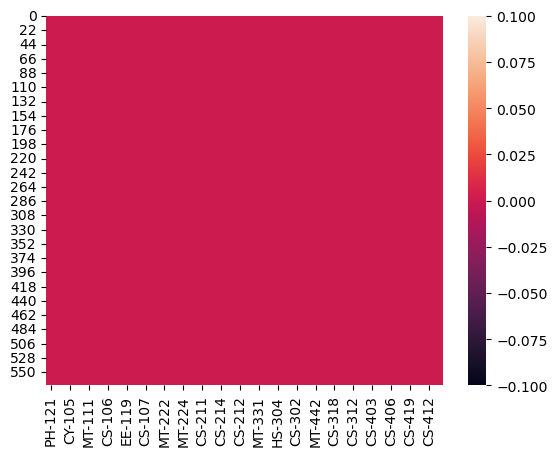

In [16]:
sns.heatmap(df.isnull())

In [17]:
#checking the value count in each column
for i in df.columns:
    print(df[i].value_counts())
    print("\n")
    



A-    112
A     111
B+     61
B      57
B-     56
D      44
C      33
C+     31
D+     22
A+     22
C-     19
WU      2
F       1
Name: PH-121, dtype: int64


A-    82
B-    78
C     68
B     63
B+    59
C-    50
C+    47
D     45
A     38
D+    36
A+     4
F      1
Name: HS-101, dtype: int64


A     178
A-    120
B+     50
B      49
B-     42
D      31
A+     31
C      19
C+     17
C-     16
D+     14
WU      3
F       1
Name: CY-105, dtype: int64


A     97
A-    75
B+    70
B     57
D     45
C     41
B-    40
C+    39
C-    36
D+    34
A+    34
WU     2
F      1
Name: HS-105/12, dtype: int64


A-    107
A     100
B-     70
B+     62
B      55
C-     39
C+     33
C      30
D      26
A+     23
D+     21
WU      3
F       2
Name: MT-111, dtype: int64


A     151
A-    134
B+     60
B      51
A+     43
B-     38
C+     23
C      22
C-     22
D+     15
D      12
Name: CS-105, dtype: int64


A-    118
B+    101
B      96
A      56
B-     54
C+     41
D+     29
C-     27
D      24
C      1

In [18]:
from sklearn.preprocessing import OrdinalEncoder
OE=OrdinalEncoder()
for i in df.columns:
    if df[i].dtype=='object':
        df[i]=OE.fit_transform(df[i].values.reshape(-1,1))
df

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,5.0,10.0,8.0,6.0,8.0,10.0,9.0,8.0,5.0,8.0,...,8.0,8.0,8.0,8.0,2.0,0.0,8.0,3.0,2.0,2.205
1,0.0,9.0,10.0,9.0,5.0,6.0,9.0,0.0,10.0,9.0,...,10.0,9.0,6.0,9.0,2.0,5.0,6.0,6.0,3.0,2.008
2,0.0,3.0,0.0,5.0,4.0,0.0,5.0,4.0,2.0,2.0,...,3.0,3.0,0.0,6.0,0.0,0.0,0.0,2.0,0.0,3.608
3,9.0,7.0,10.0,9.0,9.0,2.0,10.0,8.0,9.0,7.0,...,10.0,6.0,10.0,8.0,5.0,3.0,7.0,7.0,7.0,1.906
4,2.0,2.0,2.0,4.0,0.0,0.0,2.0,4.0,0.0,2.0,...,5.0,4.0,4.0,5.0,2.0,0.0,2.0,2.0,0.0,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3.0,0.0,0.0,2.0,1.0,0.0,2.0,2.0,1.0,4.0,...,2.0,2.0,0.0,0.0,0.0,4.0,4.0,3.0,0.0,3.798
567,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,4.0,4.0,0.0,0.0,2.0,3.0,2.0,6.0,2.0,3.772
568,3.0,0.0,2.0,4.0,0.0,0.0,0.0,0.0,0.0,3.0,...,2.0,3.0,0.0,4.0,0.0,6.0,4.0,2.0,2.0,3.470
569,0.0,4.0,9.0,0.0,9.0,10.0,5.0,8.0,5.0,8.0,...,9.0,3.0,3.0,8.0,9.0,6.0,3.0,5.0,6.0,2.193


In [ ]:
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

In [20]:
df.describe()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
count,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,...,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000
mean,3.781086,5.071804,2.898424,4.241681,3.896673,2.838879,4.122592,3.959720,3.886165,4.779335,...,4.071804,4.835377,3.432574,5.385289,2.984238,2.397548,3.856392,3.966725,3.049037,2.954888
std,3.046895,2.785317,2.964737,3.200507,2.988546,2.696709,2.727192,3.031436,2.657528,3.146202,...,3.362345,2.740382,2.980685,2.729063,2.468346,2.499388,2.382769,2.795475,2.332316,0.620552
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800000
25%,2.000000,3.000000,0.000000,2.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,...,1.000000,3.000000,0.000000,3.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.538000
50%,3.000000,5.000000,2.000000,4.000000,4.000000,2.000000,4.000000,3.000000,3.000000,5.000000,...,3.000000,5.000000,3.000000,5.000000,2.000000,2.000000,4.000000,4.000000,2.000000,3.029000
75%,6.000000,7.000000,4.500000,7.000000,6.000000,4.000000,5.000000,6.000000,6.000000,8.000000,...,7.000000,7.000000,5.000000,7.000000,4.000000,4.000000,5.000000,6.000000,4.000000,3.451000
max,12.000000,11.000000,12.000000,12.000000,12.000000,10.000000,12.000000,12.000000,11.000000,12.000000,...,13.000000,11.000000,10.000000,12.000000,13.000000,12.000000,11.000000,11.000000,12.000000,3.985000


Above we can see that there are 571 rows in the dataset and we have taken care of all the null values. In all the columns the mean is greater than median which indicates the presence of positive skewness except for CGPA which is left skewed

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 42 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PH-121     571 non-null    float64
 1   HS-101     571 non-null    float64
 2   CY-105     571 non-null    float64
 3   HS-105/12  571 non-null    float64
 4   MT-111     571 non-null    float64
 5   CS-105     571 non-null    float64
 6   CS-106     571 non-null    float64
 7   EL-102     571 non-null    float64
 8   EE-119     571 non-null    float64
 9   ME-107     571 non-null    float64
 10  CS-107     571 non-null    float64
 11  HS-205/20  571 non-null    float64
 12  MT-222     571 non-null    float64
 13  EE-222     571 non-null    float64
 14  MT-224     571 non-null    float64
 15  CS-210     571 non-null    float64
 16  CS-211     571 non-null    float64
 17  CS-203     571 non-null    float64
 18  CS-214     571 non-null    float64
 19  EE-217     571 non-null    float64
 20  CS-212    

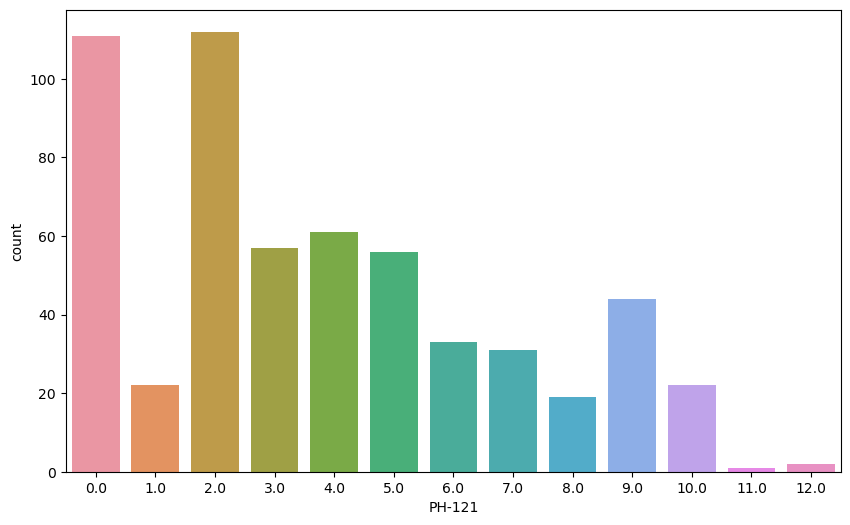

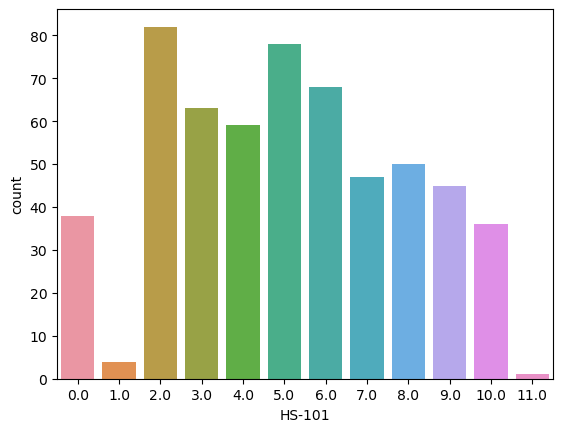

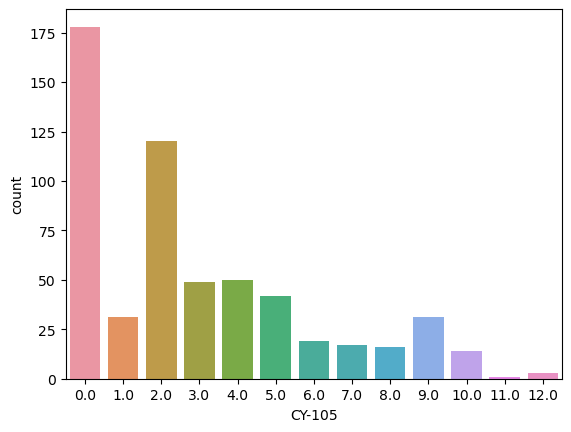

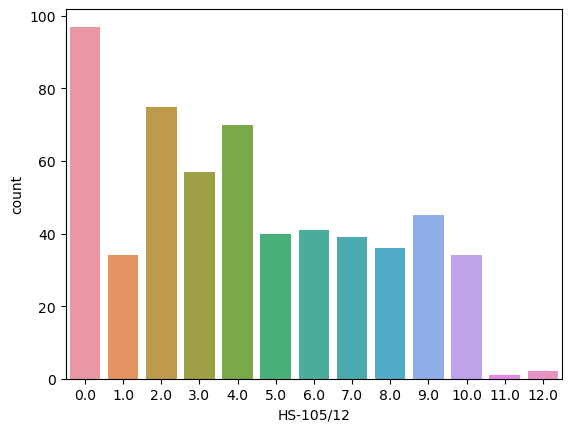

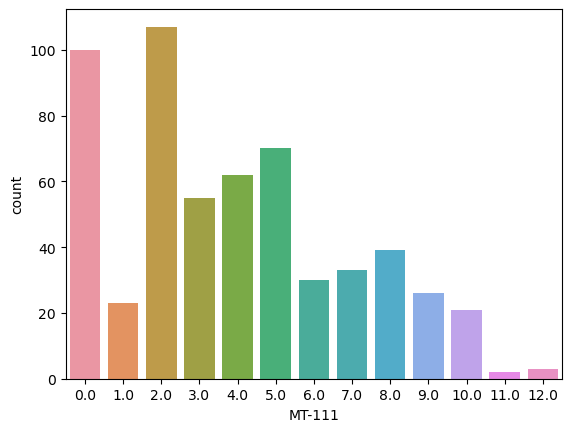

...

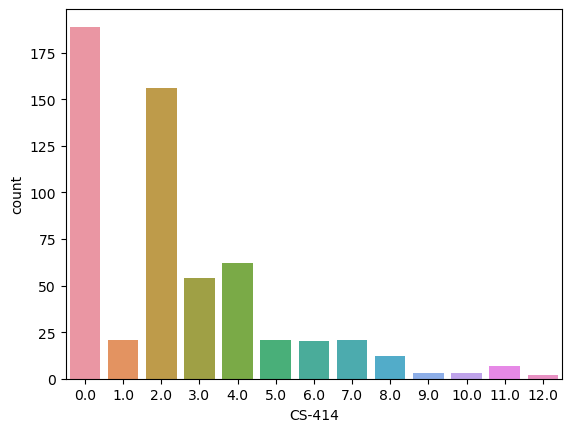

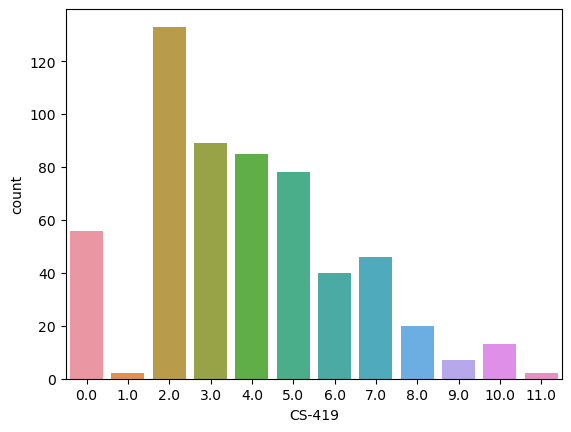

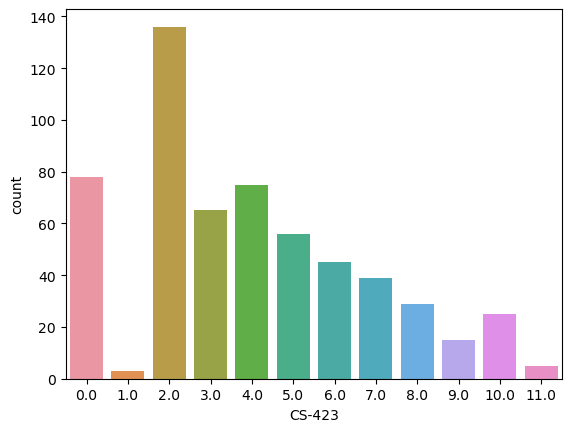

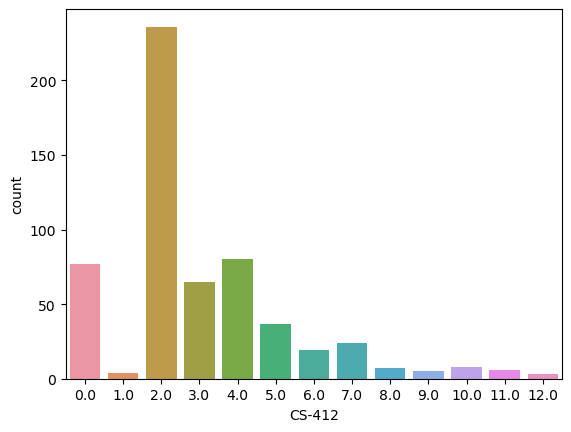

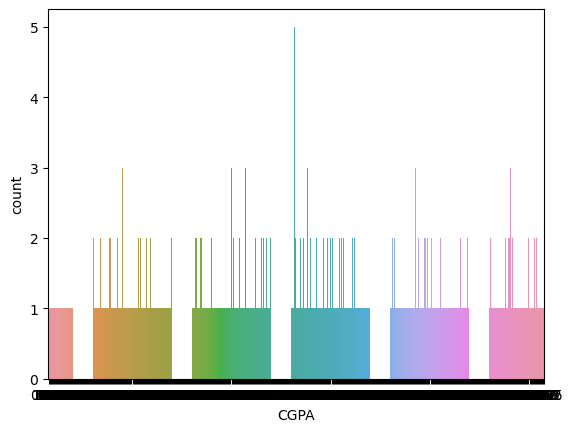

In [22]:
plt.figure(figsize=(10,6))
z=1
for i in df:
    if z<=42:
        sns.countplot(x=i,data=df)
        plt.show()
        z+=1

As we can see above the various count plots for all the columns in the dataset and the frequency of each value. Here we can observe that as the value increases the count decreses.

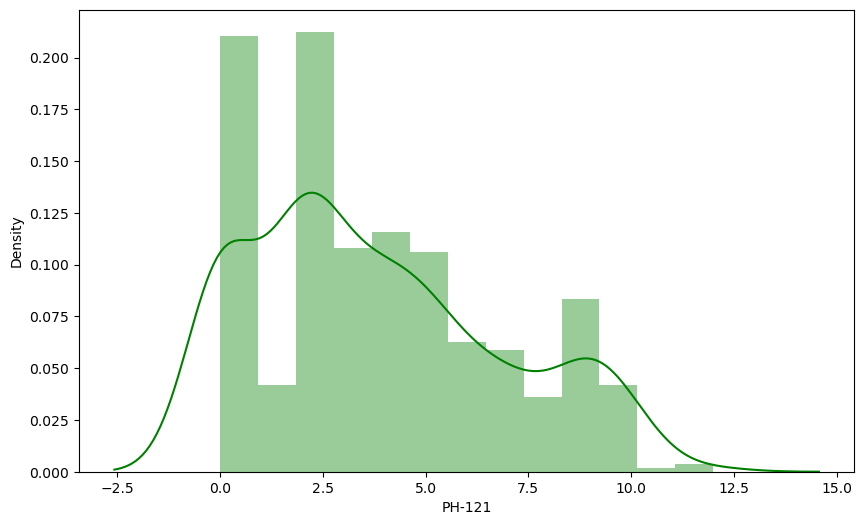

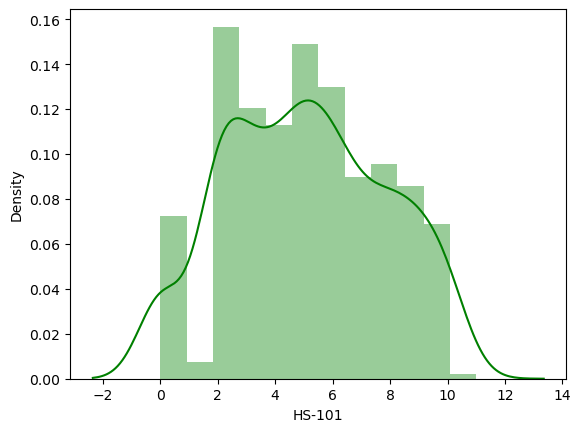

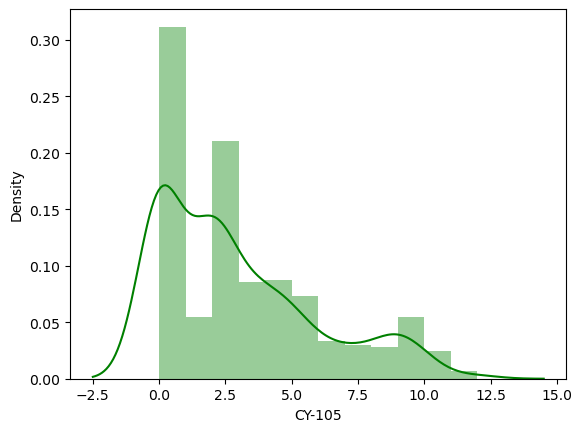

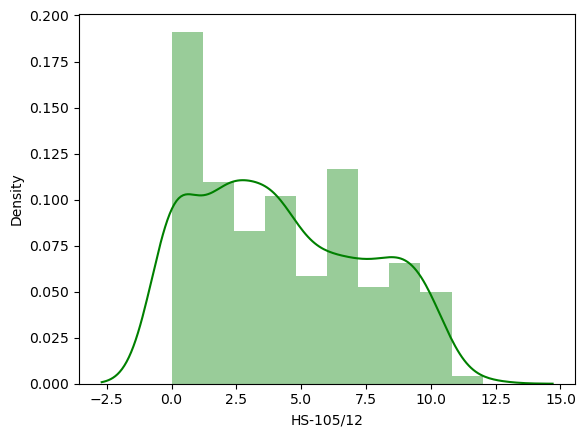

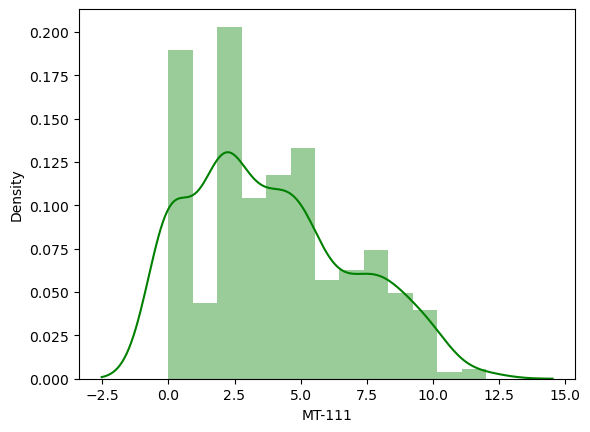

...

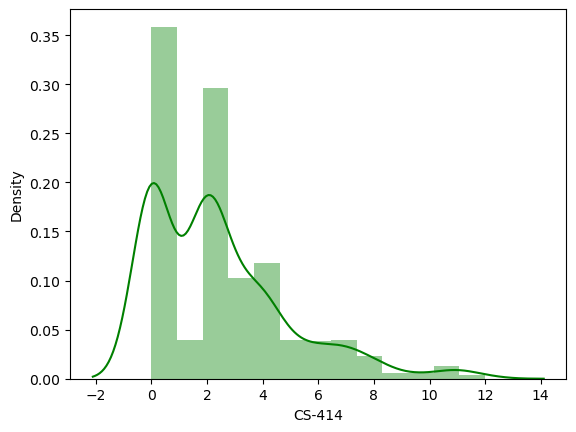

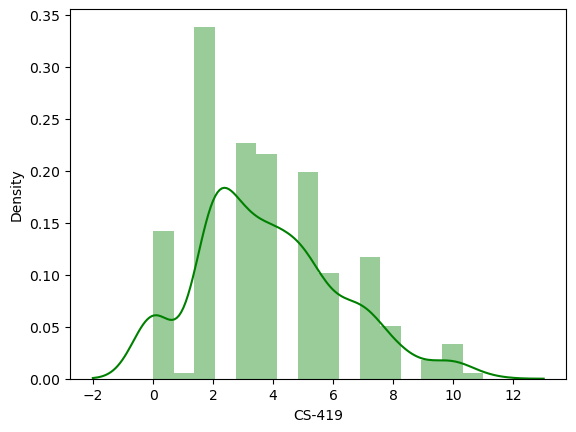

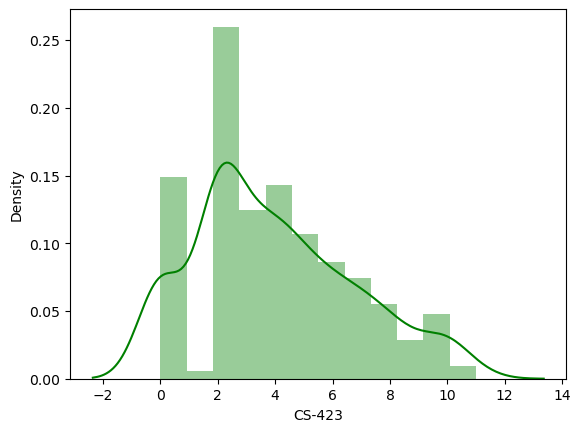

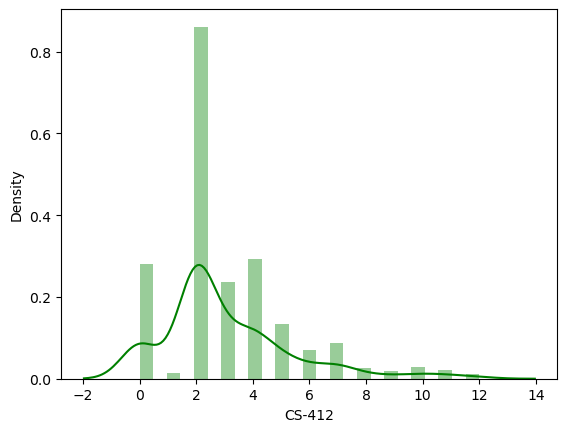

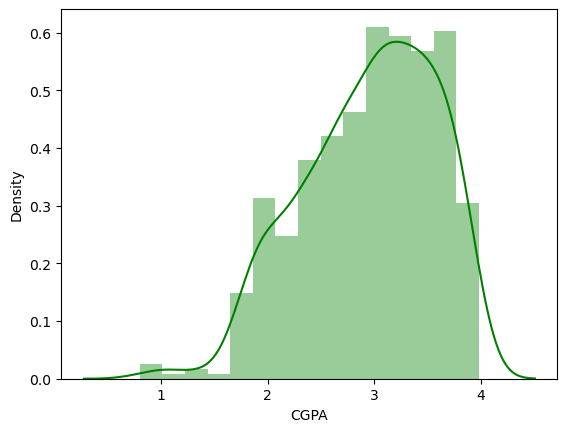

<Figure size 640x480 with 0 Axes>

In [23]:
plt.figure(figsize=(10,6))
z=1
for i in df:
    if z<=42:
        sns.distplot(df[i],color='g')
        plt.show()
        z+=1
plt.tight_layout()

Above we can see the distribution plot where all the data is slightly right skewed except CGPA which is left skewed.

In [24]:
sns.pairplot(data=df)
   

PH-121          Axes(0.125,0.836742;0.227941x0.0432584)
HS-101       Axes(0.398529,0.836742;0.227941x0.0432584)
CY-105       Axes(0.672059,0.836742;0.227941x0.0432584)
HS-105/12       Axes(0.125,0.784831;0.227941x0.0432584)
MT-111       Axes(0.398529,0.784831;0.227941x0.0432584)
CS-105       Axes(0.672059,0.784831;0.227941x0.0432584)
CS-106          Axes(0.125,0.732921;0.227941x0.0432584)
EL-102       Axes(0.398529,0.732921;0.227941x0.0432584)
EE-119       Axes(0.672059,0.732921;0.227941x0.0432584)
ME-107          Axes(0.125,0.681011;0.227941x0.0432584)
CS-107       Axes(0.398529,0.681011;0.227941x0.0432584)
HS-205/20    Axes(0.672059,0.681011;0.227941x0.0432584)
MT-222          Axes(0.125,0.629101;0.227941x0.0432584)
EE-222       Axes(0.398529,0.629101;0.227941x0.0432584)
MT-224       Axes(0.672059,0.629101;0.227941x0.0432584)
CS-210          Axes(0.125,0.577191;0.227941x0.0432584)
CS-211       Axes(0.398529,0.577191;0.227941x0.0432584)
CS-203       Axes(0.672059,0.577191;0.227941x0.0

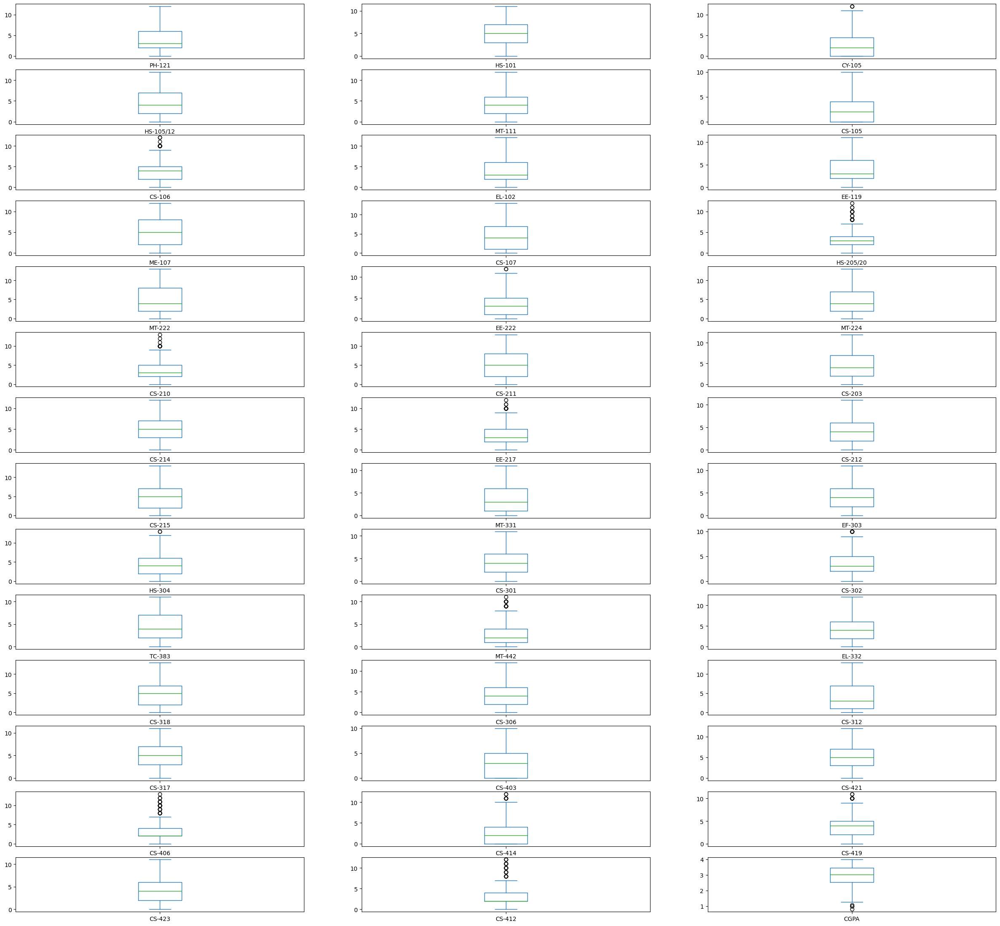

In [25]:
df.plot(kind='box',subplots=True,layout=(15,3),figsize=(30,30))

Here we can see the presence of outliers in certain columns.But Since the data is catagorical we will not remove outliers

In [26]:
dfcor=df.corr()

In [27]:
dfcor

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
PH-121,1.000000,0.382436,0.557843,0.498561,0.468968,0.609990,0.293963,0.423942,0.579964,0.533558,...,0.038184,0.464022,0.321264,0.290351,0.280166,0.152437,0.462770,0.094921,0.293815,-0.663135
HS-101,0.382436,1.000000,0.335074,0.473132,0.432742,0.400713,0.312019,0.349412,0.309697,0.336545,...,0.213380,0.364250,0.229546,0.301934,0.265551,0.225977,0.284668,0.228103,0.226039,-0.537170
CY-105,0.557843,0.335074,1.000000,0.510123,0.538380,0.578573,0.378223,0.447539,0.467250,0.464418,...,0.261555,0.472137,0.464575,0.349827,0.129957,0.008774,0.430053,0.120885,0.064912,-0.658282
HS-105/12,0.498561,0.473132,0.510123,1.000000,0.494731,0.482406,0.499093,0.360304,0.400303,0.320137,...,0.263143,0.478816,0.451907,0.415946,0.168150,0.142806,0.465352,0.235029,0.153293,-0.613989
MT-111,0.468968,0.432742,0.538380,0.494731,1.000000,0.393684,0.500729,0.555895,0.409161,0.471685,...,0.467946,0.555098,0.410540,0.511463,0.300391,0.228637,0.502473,0.400679,0.269792,-0.730095
CS-105,0.609990,0.400713,0.578573,0.482406,0.393684,1.000000,0.286324,0.353949,0.507357,0.455470,...,0.059711,0.387639,0.279329,0.236345,0.237615,0.121965,0.306827,0.045134,0.179777,-0.613169
CS-106,0.293963,0.312019,0.378223,0.499093,0.500729,0.286324,1.000000,0.338645,0.269895,0.281233,...,0.450752,0.416562,0.426402,0.397195,0.129554,0.108916,0.421989,0.339963,0.185782,-0.534995
EL-102,0.423942,0.349412,0.447539,0.360304,0.555895,0.353949,0.338645,1.000000,0.448908,0.461690,...,0.301324,0.466556,0.304240,0.368959,0.253133,0.242234,0.379308,0.369173,0.265289,-0.642262
EE-119,0.579964,0.309697,0.467250,0.400303,0.409161,0.507357,0.269895,0.448908,1.000000,0.572964,...,0.156809,0.445496,0.341988,0.359230,0.297664,0.214165,0.465913,0.244615,0.320746,-0.646829
ME-107,0.533558,0.336545,0.464418,0.320137,0.471685,0.455470,0.281233,0.461690,0.572964,1.000000,...,0.199848,0.462568,0.336647,0.345832,0.300913,0.154184,0.440407,0.220977,0.293638,-0.663023


<Axes: >

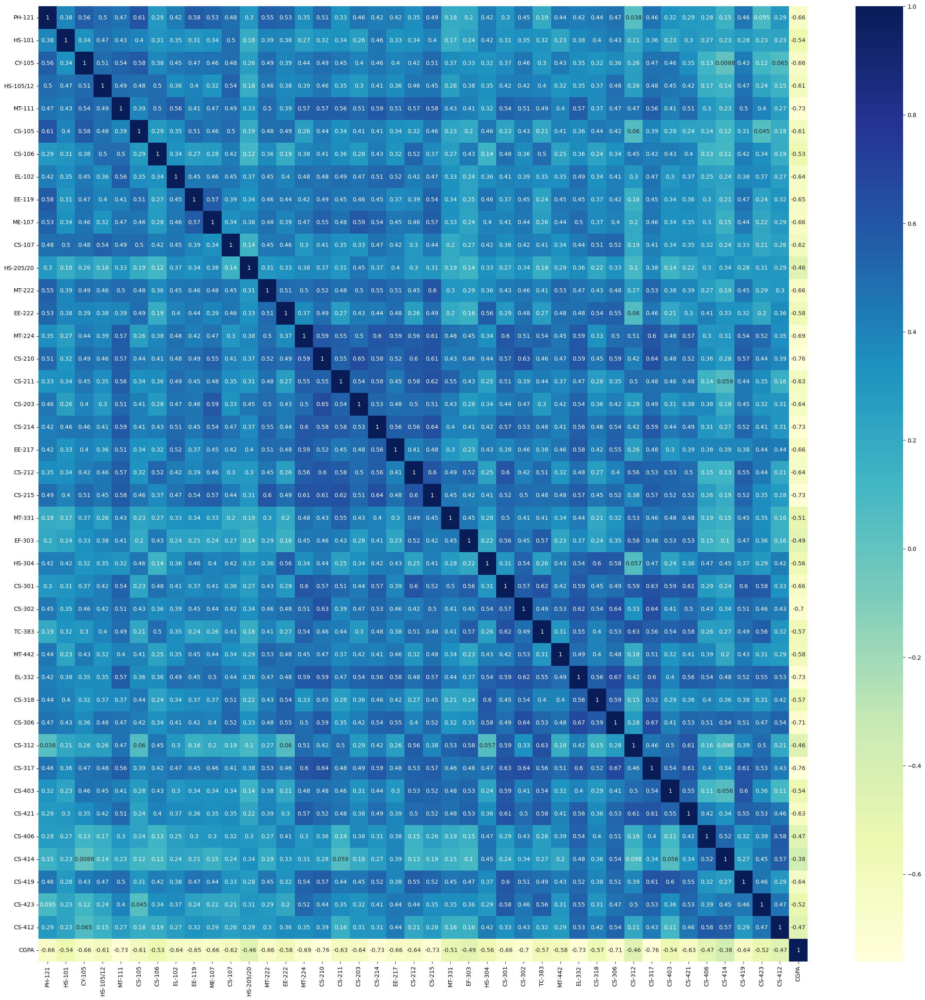

In [30]:
plt.figure(figsize=(30,30))
sns.heatmap(dfcor,annot=True,cmap='YlGnBu')

Above heatmap shows the correlation between various columns and we can conclude that all columns have positive correlation with each other.

In [31]:
x=df.drop("CGPA",axis=1)
y=df["CGPA"]

In [32]:
#now we will scale x
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-306,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412
0,0.400402,1.770900,1.722261,0.549869,1.374222,2.657832,1.790004,1.333963,0.419492,1.024565,...,0.663660,1.169315,1.155824,1.533685,0.958939,-0.399094,-0.960095,1.740513,-0.346121,-0.450178
1,-1.242052,1.411559,2.397448,1.488043,0.369509,1.173242,1.790004,-1.307365,2.302589,1.342687,...,1.715324,1.764660,1.521056,0.862110,1.325686,-0.399094,1.042149,0.900418,0.727983,-0.021043
2,-1.242052,-0.744483,-0.978490,0.237145,0.034605,-1.053643,0.322008,0.013299,-0.710366,-0.884168,...,-0.738559,-0.319046,-0.670339,-1.152616,0.225444,-1.210063,-0.960095,-1.619869,-0.704156,-1.308446
3,1.714365,0.692879,2.397448,1.488043,1.709126,-0.311348,2.157003,1.333963,1.925970,0.706443,...,1.364769,1.764660,0.425358,2.205260,0.958939,0.817361,0.241251,1.320466,1.086017,1.695494
4,-0.585070,-1.103823,-0.303302,-0.075580,-1.305012,-1.053643,-0.778989,0.013299,-1.463605,-0.884168,...,-0.738559,0.276298,-0.305107,0.190534,-0.141304,-0.399094,-0.960095,-0.779774,-0.704156,-1.308446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,-0.256579,-1.822504,-0.978490,-0.701029,-0.970108,-1.053643,-0.778989,-0.647033,-1.086986,-0.247924,...,-0.037450,-0.616719,-1.035572,-1.152616,-1.975041,-1.210063,0.641700,0.060322,-0.346121,-1.308446
567,-0.913561,-1.822504,-0.978490,-1.326478,-1.305012,-1.053643,-1.512987,-0.647033,-1.463605,-1.520412,...,-0.738559,-0.021374,-0.305107,-1.152616,-1.975041,-0.399094,0.241251,-0.779774,0.727983,-0.450178
568,-0.256579,-1.822504,-0.303302,-0.075580,-1.305012,-1.053643,-1.512987,-1.307365,-1.463605,-0.566046,...,-0.037450,-0.616719,-0.670339,-1.152616,-0.508051,-1.210063,1.442597,0.060322,-0.704156,-0.450178
569,-1.242052,-0.385142,2.059854,-1.326478,1.709126,2.657832,0.322008,1.333963,0.419492,1.024565,...,-0.037450,1.466987,-0.670339,-0.145253,0.958939,2.439300,1.442597,-0.359726,0.369948,1.266360


In [33]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor
from sklearn.linear_model import Lasso,Ridge,ElasticNet

In [34]:
#Now we find the best random state with x and y
maxRS=0
maxaccu=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxRS=i
print("Maximum r2 score is ",maxaccu, "at random state ",maxRS)

Maximum r2 score is  0.9643494726169242 at random state  72


In [35]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

In [36]:
LR=LinearRegression()
LR.fit(x_train,y_train)
pred_LR=LR.predict(x_test)
pred_train=LR.predict(x_train)
print(LR)
print("R2_Score : ",r2_score(y_test,pred_LR))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_LR))
print("Mean Squared Error:", mean_squared_error(y_test,pred_LR))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_LR)) )

LinearRegression()
R2_Score :  0.9643494726169242
R2_Score on Training Data : 0.9139022616556756
Mean Absolute Error: 0.08938340774408557
Mean Squared Error: 0.013741931476875233
Root Mean Squared Error: 0.1172259846487767


In [37]:
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
pred_RFR= RFR.predict(x_test)
pred_train=RFR.predict(x_train)
print(RFR)
print("R2 Score: ",r2_score(y_test,pred_RFR))
print("R2 Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error : ",mean_absolute_error(y_test,pred_RFR))
print("Mean Squared Error : ",mean_squared_error(y_test,pred_RFR))
print("Root Mean Squared Error :", np.sqrt(mean_squared_error(y_test,pred_RFR)))

RandomForestRegressor()
R2 Score:  0.9338799584318602
R2 Score on Training Data : 0.9862349502670074
Mean Absolute Error :  0.11462779069767426
Mean Squared Error :  0.02548677809767439
Root Mean Squared Error : 0.1596457894768114


In [38]:
KNR=KNeighborsRegressor()
KNR.fit(x_train,y_train)
pred_KNR= KNR.predict(x_test)
pred_train=KNR.predict(x_train)
print(KNR)
print("R2 Score: ",r2_score(y_test,pred_KNR))
print("R2 Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error : ",mean_absolute_error(y_test,pred_KNR))
print("Mean Squared Error : ",mean_squared_error(y_test,pred_KNR))
print("Root Mean Squared Error :", np.sqrt(mean_squared_error(y_test,pred_KNR)))

KNeighborsRegressor()
R2 Score:  0.9717167269517839
R2 Score on Training Data : 0.9167450579640872
Mean Absolute Error :  0.08034767441860463
Mean Squared Error :  0.01090213325581395
Root Mean Squared Error : 0.10441328103174399


In [39]:
GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)
pred_GBR=GBR.predict(x_test)
pred_train=GBR.predict(x_train)
print(GBR)
print("R2_Score : ",r2_score(y_test,pred_GBR))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_GBR))
print("Mean Squared Error:", mean_squared_error(y_test,pred_GBR))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_GBR)) )

GradientBoostingRegressor()
R2_Score :  0.9672442298384288
R2_Score on Training Data : 0.9953002375042729
Mean Absolute Error: 0.08249862315612129
Mean Squared Error: 0.012626111928046016
Root Mean Squared Error: 0.1123659731771412


In [40]:
SVR=SVR()
SVR.fit(x_train,y_train)
pred_SVR=SVR.predict(x_test)
pred_train=SVR.predict(x_train)
print(SVR)
print("R2_Score : ",r2_score(y_test,pred_SVR))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_SVR))
print("Mean Squared Error:", mean_squared_error(y_test,pred_SVR))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_SVR)) )

SVR()
R2_Score :  0.9721144817654247
R2_Score on Training Data : 0.9606739452297576
Mean Absolute Error: 0.07683844583277179
Mean Squared Error: 0.01074881380180095
Root Mean Squared Error: 0.10367648625315651


In [41]:
lasso=Lasso()
lasso.fit(x_train,y_train)
pred_lasso=lasso.predict(x_test)
pred_train=lasso.predict(x_train)
print(lasso)
print("R2_Score : ",r2_score(y_test,pred_lasso))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_lasso))
print("Mean Squared Error:", mean_squared_error(y_test,pred_lasso))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_lasso)) )


Lasso()
R2_Score :  -0.002069645787602381
R2_Score on Training Data : 0.0
Mean Absolute Error: 0.5310373025587224
Mean Squared Error: 0.3862599915985248
Root Mean Squared Error: 0.6214981831015476


In [42]:
ridge=Ridge()
ridge.fit(x_train,y_train)
pred_ridge=ridge.predict(x_test)
pred_train=ridge.predict(x_train)
print(ridge)
print("R2_Score : ",r2_score(y_test,pred_ridge))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_ridge))
print("Mean Squared Error:", mean_squared_error(y_test,pred_ridge))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_ridge)) )


Ridge()
R2_Score :  0.9645753308300019
R2_Score on Training Data : 0.9139012103068384
Mean Absolute Error: 0.08910889992551611
Mean Squared Error: 0.013654871668355328
Root Mean Squared Error: 0.11685406141146883


In [43]:
EN=ElasticNet()
EN.fit(x_train,y_train)
pred_EN=EN.predict(x_test)
pred_train=EN.predict(x_train)
print(EN)
print("R2_Score : ",r2_score(y_test,pred_EN))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_EN))
print("Mean Squared Error:", mean_squared_error(y_test,pred_EN))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_EN)) )


ElasticNet()
R2_Score :  -0.002069645787602381
R2_Score on Training Data : 0.0
Mean Absolute Error: 0.5310373025587224
Mean Squared Error: 0.3862599915985248
Root Mean Squared Error: 0.6214981831015476


In [44]:
DTR=DecisionTreeRegressor()
DTR.fit(x_train,y_train)
pred_DTR=DTR.predict(x_test)
pred_train=DTR.predict(x_train)
print(DTR)
print("R2_Score : ",r2_score(y_test,pred_DTR))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_DTR))
print("Mean Squared Error:", mean_squared_error(y_test,pred_DTR))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_DTR)) )


DecisionTreeRegressor()
R2_Score :  0.8688605837363494
R2_Score on Training Data : 1.0
Mean Absolute Error: 0.17230232558139533
Mean Squared Error: 0.0505492906976744
Root Mean Squared Error: 0.22483169415737275


In [45]:
AD=AdaBoostRegressor()
AD.fit(x_train,y_train)
pred_AD=AD.predict(x_test)
pred_train=AD.predict(x_train)
print(AD)
print("R2_Score : ",r2_score(y_test,pred_AD))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_AD))
print("Mean Squared Error:", mean_squared_error(y_test,pred_AD))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_AD)))

AdaBoostRegressor()
R2_Score :  0.8910229885503717
R2_Score on Training Data : 0.9283763086373846
Mean Absolute Error: 0.1655625911955373
Mean Squared Error: 0.0420065209079169
Root Mean Squared Error: 0.2049549240879977


In [46]:
BR=BaggingRegressor()
BR.fit(x_train,y_train)
pred_BR=BR.predict(x_test)
pred_train=BR.predict(x_train)
print(BR)
print("R2_Score : ",r2_score(y_test,pred_BR))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_BR))
print("Mean Squared Error:", mean_squared_error(y_test,pred_BR))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_BR)))

BaggingRegressor()
R2_Score :  0.9264500067456223
R2_Score on Training Data : 0.9710588196056141
Mean Absolute Error: 0.12041337209302322
Mean Squared Error: 0.028350743779069765
Root Mean Squared Error: 0.16837679109387305


In [47]:
ETR=ExtraTreesRegressor()
ETR.fit(x_train,y_train)
pred_ETR=ETR.predict(x_test)
pred_train=ETR.predict(x_train)
print(ETR)
print("R2_Score : ",r2_score(y_test,pred_ETR))
print("R2_Score on Training Data :", r2_score(y_train,pred_train))
print("Mean Absolute Error:", mean_absolute_error(y_test,pred_ETR))
print("Mean Squared Error:", mean_squared_error(y_test,pred_ETR))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_ETR)))

ExtraTreesRegressor()
R2_Score :  0.9649661751402631
R2_Score on Training Data : 1.0
Mean Absolute Error: 0.08557837209302316
Mean Squared Error: 0.01350421595232559
Root Mean Squared Error: 0.11620764154015686


In [48]:
R2_Score=pd.DataFrame([['Linear Regression',r2_score(y_test,pred_LR)],['RandomForestRegressor',r2_score(y_test,pred_RFR)],['GradientBoostingRegressor',r2_score(y_test,pred_GBR)],['KNeighborsRegressor',r2_score(y_test,pred_KNR)],['SVR',r2_score(y_test,pred_SVR)],['Lasso',r2_score(y_test,pred_lasso)],['Ridge',r2_score(y_test,pred_ridge)],['ElasticNet',r2_score(y_test,pred_EN)],['DecisionTreeRegressor',r2_score(y_test,pred_DTR)],['AdaBoostRegressor',r2_score(y_test,pred_AD)],['BaggingRegressor',r2_score(y_test,pred_BR)],['ExtraTreesRegressor',r2_score(y_test,pred_ETR)]],columns=['Model','R2 Score'])
R2_Score

,Model,R2 Score
0,Linear Regression,0.964349
1,RandomForestRegressor,0.933880
2,GradientBoostingRegressor,0.967244
3,KNeighborsRegressor,0.971717
4,SVR,0.972114
5,Lasso,-0.002070
6,Ridge,0.964575
7,ElasticNet,-0.002070
8,DecisionTreeRegressor,0.868861
9,AdaBoostRegressor,0.891023


Here we can see that SVR has the highest r2 score. We will validate the same with cv score

In [49]:
from sklearn.model_selection import cross_val_score
#default cv=5

In [50]:
cvs=cross_val_score
score_LR=cvs(LR,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_LR))
print(score_LR)
print(score_LR.mean())
print("Difference between r2 score and Cross Val Score for Linear regression is :", (r2_score(y_test,pred_LR)-score_LR.mean())*100)

0.9643494726169242
[0.8927601  0.93427094 0.90082619 0.94061762 0.84878197]
0.9034513625626615
Difference between r2 score and Cross Val Score for Linear regression is : 6.089811005426271


In [51]:
score_RFR=cvs(RFR,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_RFR))
print(score_RFR)
print(score_RFR.mean())
print("Difference between r2 score and Cross Val Score for RandomForestRegressor is :", (r2_score(y_test,pred_RFR)-score_RFR.mean())*100)

0.9338799584318602
[0.8953364  0.92466797 0.94589687 0.92817696 0.85425605]
0.9096668475021097
Difference between r2 score and Cross Val Score for RandomForestRegressor is : 2.4213110929750536


In [52]:
score_KNR=cvs(KNR,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_KNR))
print(score_KNR)
print(score_KNR.mean())
print("Difference between r2 score and Cross Val Score for KNeighborsRegressor is :", (r2_score(y_test,pred_KNR)-score_KNR.mean())*100)

0.9717167269517839
[0.88957963 0.9359176  0.8654431  0.96068931 0.80762497]
0.891850920275352
Difference between r2 score and Cross Val Score for KNeighborsRegressor is : 7.986580667643195


In [53]:
score_GBR=cvs(GBR,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_GBR))
print(score_GBR)
print(score_GBR.mean())
print("Difference between r2 score and Cross Val Score for GradientBoostingRegressor is :", (r2_score(y_test,pred_GBR)-score_GBR.mean())*100)

0.9672442298384288
[0.91843529 0.95702501 0.95769126 0.94830453 0.87535389]
0.9313619987529738
Difference between r2 score and Cross Val Score for GradientBoostingRegressor is : 3.5882231085455074


In [54]:
score_SVR=cvs(SVR,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_SVR))
print(score_SVR)
print(score_SVR.mean())
print("Difference between r2 score and Cross Val Score for SVR is :", (r2_score(y_test,pred_SVR)-score_SVR.mean())*100)

0.9721144817654247
[0.89656309 0.92627299 0.90977131 0.9411797  0.85204761]
0.9051669400105776
Difference between r2 score and Cross Val Score for SVR is : 6.694754175484707


In [55]:
score_lasso=cvs(lasso,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_lasso))
print(score_lasso)
print(score_lasso.mean())
print("Difference between r2 score and Cross Val Score for Lasso is :", (r2_score(y_test,pred_lasso)-score_lasso.mean())*100)

-0.002069645787602381
[-0.00643799 -0.0037979  -0.00364638 -0.00242138 -0.02411396]
-0.008083520623131602
Difference between r2 score and Cross Val Score for Lasso is : 0.6013874835529222


In [56]:
score_ridge=cvs(ridge,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_ridge))
print(score_ridge)
print(score_ridge.mean())
print("Difference between r2 score and Cross Val Score for Ridge is :", (r2_score(y_test,pred_ridge)-score_ridge.mean())*100)

0.9645753308300019
[0.89292168 0.93429658 0.90102969 0.94099039 0.84890717]
0.9036291005426633
Difference between r2 score and Cross Val Score for Ridge is : 6.094623028733858


In [57]:
score_DTR=cvs(DTR,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_DTR))
print(score_DTR)
print(score_DTR.mean())
print("Difference between r2 score and Cross Val Score for DecisionTreeRegressor is :", (r2_score(y_test,pred_DTR)-score_DTR.mean())*100)

0.8688605837363494
[0.82759216 0.78028187 0.89474914 0.78377843 0.7308665 ]
0.8034536207235892
Difference between r2 score and Cross Val Score for DecisionTreeRegressor is : 6.540696301276028


In [58]:
score_EN=cvs(EN,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_EN))
print(score_EN)
print(score_EN.mean())
print("Difference between r2 score and Cross Val Score for ElasticNet is :", (r2_score(y_test,pred_EN)-score_EN.mean())*100)

-0.002069645787602381
[-0.00643799 -0.0037979  -0.00364638 -0.00242138 -0.02411396]
-0.008083520623131602
Difference between r2 score and Cross Val Score for ElasticNet is : 0.6013874835529222


In [59]:
score_AD=cvs(AD,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_AD))
print(score_AD)
print(score_AD.mean())
print("Difference between r2 score and Cross Val Score for AdaBoostRegressor is :", (r2_score(y_test,pred_AD)-score_AD.mean())*100)

0.8910229885503717
[0.85727442 0.8991298  0.89621089 0.86784317 0.80900632]
0.8658929194544716
Difference between r2 score and Cross Val Score for AdaBoostRegressor is : 2.51300690959001


In [60]:
score_BR=cvs(BR,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_BR))
print(score_BR)
print(score_BR.mean())
print("Difference between r2 score and Cross Val Score for BaggingRegressor is :", (r2_score(y_test,pred_BR)-score_BR.mean())*100)

0.9264500067456223
[0.89592424 0.91814538 0.93220248 0.91153118 0.8497044 ]
0.9015015351460282
Difference between r2 score and Cross Val Score for BaggingRegressor is : 2.4948471599594124


In [68]:
score_ETR=cvs(ETR,x,y,cv=5,scoring='r2')
print(r2_score(y_test,pred_ETR))
print(score_ETR)
print(score_ETR.mean())
print("Difference between r2 score and Cross Val Score for ExtraTreesRegressor is :", (r2_score(y_test,pred_ETR)-score_ETR.mean())*100)

0.9649661751402631
[0.91478206 0.95246272 0.95080013 0.94522327 0.8780241 ]
0.9282584533966908
Difference between r2 score and Cross Val Score for ExtraTreesRegressor is : 3.6707721743572286


Observation:
Above we can see that  Gradient Boosting Regressor has highest cross val score. Moreover, the difference between r2 score and cv score is also less. Hence we can say that GBR is our best model.
r2_score=0.967
cvs=0.931
Difference between r2 score and Cross Val Score for Extra Trees Regressor is : 3.58

HYPERPARAMETER TUNING

In [69]:
from sklearn.model_selection import GridSearchCV

In [70]:
params={'n_estimators':[100,200,400,600],'criterion':['friedman_mse','squared error'],'random_state':[10,20,30,32,40]}

In [71]:
GCV=GridSearchCV(GBR,params,cv=5)

In [72]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'criterion': ['friedman_mse', 'squared error'],
                         'n_estimators': [100, 200, 400, 600],
                         'random_state': [10, 20, 30, 32, 40]})

In [73]:
GCV.best_params_

{'criterion': 'friedman_mse', 'n_estimators': 600, 'random_state': 32}

In [74]:
Final_model=GradientBoostingRegressor(criterion='friedman_mse',n_estimators=600,random_state=32)
Final_model.fit(x_train,y_train)
finalpred=Final_model.predict(x_test)
print("R2_Score : ",r2_score(y_test,finalpred))
print("Mean Absolute Error:", mean_absolute_error(y_test,finalpred))
print("Mean Squared Error:", mean_squared_error(y_test,finalpred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,finalpred)))

R2_Score :  0.9704257166461321
Mean Absolute Error: 0.07702156547052522
Mean Squared Error: 0.011399768955997982
Root Mean Squared Error: 0.10676970055216031


SAVING BEST MODEL

In [75]:
import joblib
import pickle
filename='Student Grade.pkl'
pickle.dump(Final_model,open(filename,'wb'))
loaded_model=pickle.load(open('Student Grade.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)


97.0425716646132


In [76]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

In [77]:
conclusion

,0,1,2,3,4,5,6,7,8,9,...,162,163,164,165,166,167,168,169,170,171
Predicted,2.053342,3.573159,3.147904,2.631894,2.644161,3.692693,3.261423,3.967545,3.4543,3.897824,...,2.469547,2.442278,2.846976,2.746266,2.14763,2.076854,3.523731,2.886936,2.068537,3.586493
Original,2.288000,3.566000,3.114000,2.384000,2.311000,3.700000,3.350000,3.943000,3.4430,3.908000,...,2.564000,2.484000,2.917000,2.782000,2.32100,2.188000,3.554000,3.058000,2.087000,3.647000


In [ ]:
#Finish